In [1]:
from igraph import *
import igraph
import json
import random
import numpy as np
from numpy import linalg 
import itertools
import matplotlib.pyplot as plt
from scipy.spatial import Delaunay  # needed for triangulation
import os
import pandas as pd
from copy import deepcopy

C:\Users\yaman\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\yaman\anaconda3\lib\site-packages\numpy\.libs\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll
C:\Users\yaman\anaconda3\lib\site-packages\numpy\.libs\libopenblas.FB5AE2TYXYH2IJRDKGDGQ3XBKLKTF43H.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [2]:
pip install pycairo

Note: you may need to restart the kernel to use updated packages.


In [3]:
random.seed(2022)
np.random.seed(2022)

In [4]:
with open('los_angeles_censustracts.json') as f:
    census_tracts = json.loads(f.readline())

census_tracts['features'][0]['properties']
display_names = dict()
coordinates = dict()

for area in census_tracts['features']:
    id = int(area['properties']['MOVEMENT_ID'])
    display_name = area['properties']['DISPLAY_NAME']
    display_names[id] = display_name
    a = area['geometry']['coordinates'][0]
    coordinates[id] = np.array(a if type(a[0][0]) == float else a[0]).mean(axis=0)

In [5]:
census_tracts['features'][0]['properties']

{'MOVEMENT_ID': '1', 'TRACT': '480302', 'DISPLAY_NAME': 'Census Tract 480302'}

In [6]:
np.array(census_tracts['features'][0]['geometry']['coordinates'][0]).mean(axis=0)  # [longitude, latitude] 

array([-118.12053321,   34.10309557])

In [7]:
for i in range(5):
    key = i + 1
    print('{}: {}, {}'.format(key, display_names[key], coordinates[key]))

1: Census Tract 480302, [-118.12053321   34.10309557]
2: Census Tract 480303, [-118.13785063   34.09645121]
3: Census Tract 480304, [-118.13138209   34.09626386]
4: Census Tract 480400, [-118.13224544   34.10349303]
5: Census Tract 480500, [-118.14492317   34.0986815 ]


In [8]:
g = Graph(directed=False)
g.add_vertices(len(display_names))
g.vs['display_name'] = list(display_names.values())  # index = id - 1
g.vs['coordinates'] = list(coordinates.values())

In [9]:
month_filter = {12}  # for monthly aggregate data of 4th quarter, we can filter data based off of only December

edges = []
weights = []

with open('los_angeles-censustracts-2019-4-All-MonthlyAggregate.csv') as f:
    f.readline()  # skip the first line
    
    while True:
        line = f.readline()
        if line == '':
            break  # end of file
        
        vals = line.strip().split(',')
        
        # read edge info
        src, dest, month, dist = int(vals[0]), int(vals[1]), int(vals[2]), float(vals[3])

        # if data is not relevant, skip it
        if month not in month_filter:
            continue
            
        edges.append((src - 1, dest - 1))
        weights.append(dist)     

In [10]:
g.add_edges(edges)
g.es['weight'] = weights
del edges, weights

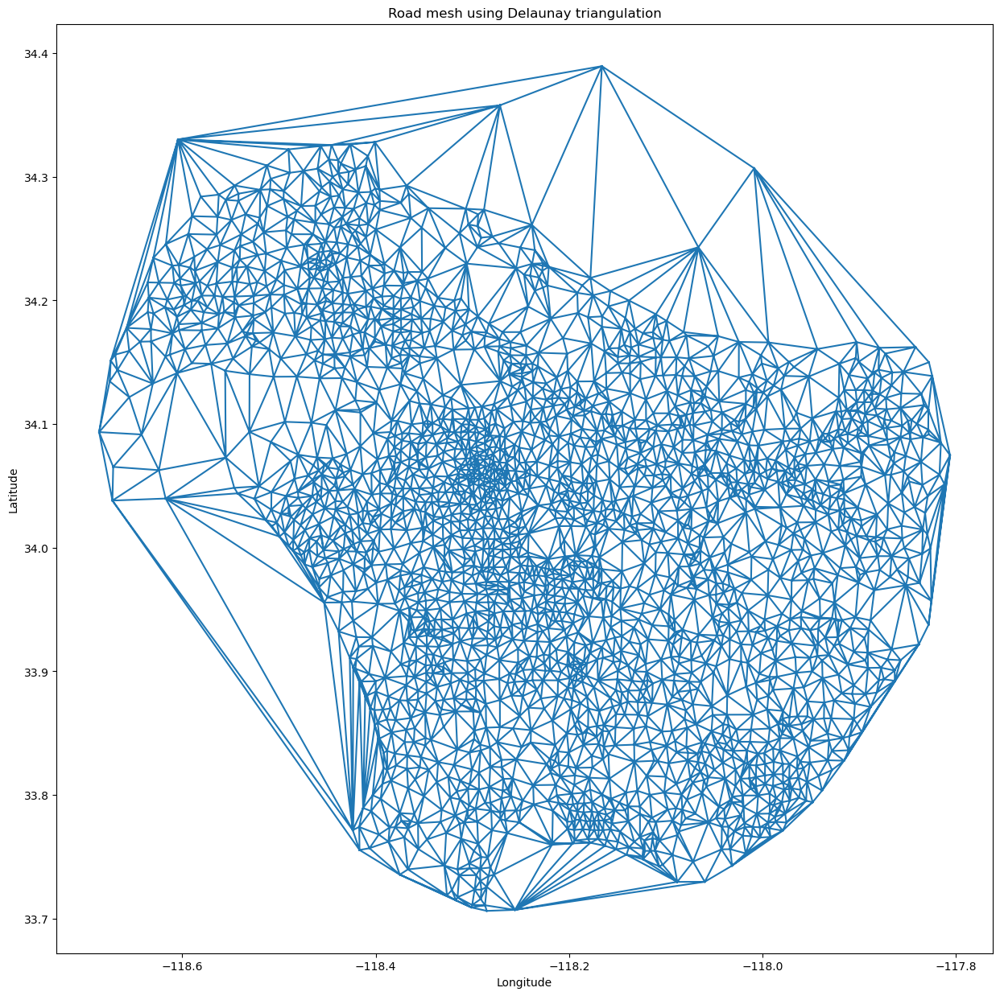

In [11]:
#Question 14
all_coordinates = np.array(g.vs['coordinates'])
tri = Delaunay(all_coordinates)

plt.figure(figsize = (15,15))
plt.triplot(all_coordinates[:,0], all_coordinates[:,1], tri.simplices.copy())
plt.title('Road mesh using Delaunay triangulation')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [12]:
duplicates = set()
edges_to_induce = []
for idx in range(len(tri.simplices)):
    for col1, col2 in ((0,1),(1,2),(0,2)):
        p = tuple(tri.simplices[idx][[col1,col2]])
        list_p = tuple(np.sort(p)) 
        v1  = list_p[0]
        v2  = list_p[1]
        if not list_p in duplicates and g.get_eid(v1,v2,directed = False,error = False) != -1 :    
            duplicates.add(list_p)
            edges_to_induce.append(list_p)

In [13]:
tri_g = g.subgraph_edges(edges_to_induce)

In [14]:
visual_style = {}
visual_style["bbox"] = (300, 300)
visual_style["margin"] = 10
visual_style["vertex_size"] = 3
igraph.plot(tri_g,**visual_style)

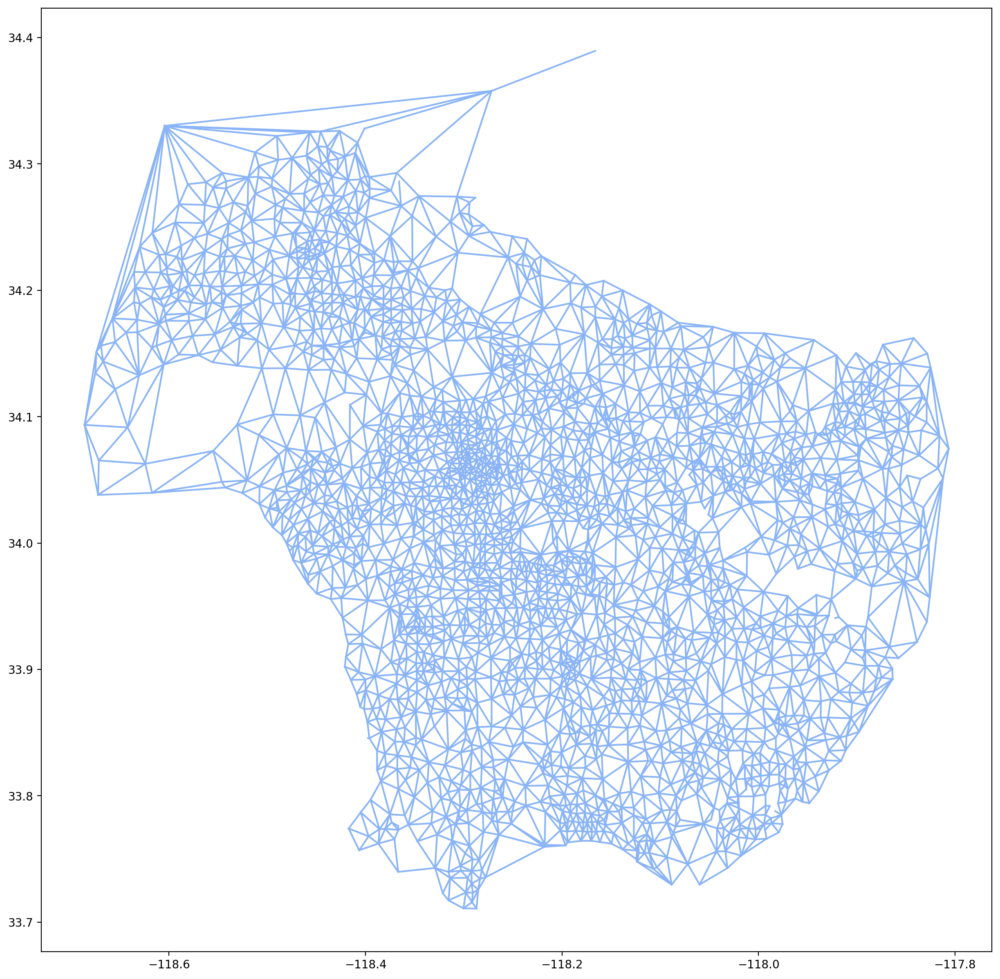

In [15]:
plt.figure(figsize=(15,15), dpi=200)
for e in tri_g.es:
    v1 = tri_g.vs[e.source]['coordinates']
    v2 = tri_g.vs[e.target]['coordinates']
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    plt.plot(x, y,'#8ab4f7')

In [16]:
malibu_coordinates = [-118.56, 34.04]
long_beach_coordinates = [-118.18,33.77]
malibu_node_idx= np.argmin(np.sum((tri_g.vs["coordinates"] - np.array(malibu_coordinates))**2,axis = 1))
long_beach_node_idx= np.argmin(np.sum((tri_g.vs["coordinates"] - np.array(long_beach_coordinates))**2,axis = 1))
malibu_node = tri_g.vs[malibu_node_idx]
long_beach_node = tri_g.vs[long_beach_node_idx]

In [17]:
print(malibu_node)
print(long_beach_node)

igraph.Vertex(<igraph.Graph object at 0x00000197C65FDE40>, 1511, {'display_name': 'Census Tract 262604', 'coordinates': array([-118.54625915,   34.04840305])})
igraph.Vertex(<igraph.Graph object at 0x00000197C65FDE40>, 660, {'display_name': 'Census Tract 576501', 'coordinates': array([-118.1786595,   33.7717677])})


In [18]:
#Question 15-16
car_length = 0.003
n_lanes = 2

for e in tri_g.es:
    v1 = tri_g.vs[e.source]['coordinates']
    v2 = tri_g.vs[e.target]['coordinates']
    distance = 69*np.linalg.norm(np.array(v1)-np.array(v2))
    e["distance_mile"] = distance
    time = e["weight"]/3600 # hours
    mile_per_hour = distance/time # miles/hours
    safety_distance = mile_per_hour * (2/3600) #miles
    total_cars_on_road = n_lanes * distance/(car_length + safety_distance) # unitless
    cars_per_hour = total_cars_on_road/time # 1/hours
    e["capacity"] = cars_per_hour

max_car_flow = tri_g.maxflow(malibu_node, long_beach_node, capacity=tri_g.es["capacity"])    

print('Maximum number of cars than can commute per hour from Malibu to Long Beach: ',max_car_flow)


Maximum number of cars than can commute per hour from Malibu to Long Beach:  Graph flow (4 edges, 1 vs 2647 vertices, value=11069.9340)


In [19]:
n_edge_d_paths = tri_g.edge_connectivity(source=malibu_node, target=long_beach_node, checks=True)
print('Number of edge-disjoint paths: ',n_edge_d_paths)

Number of edge-disjoint paths:  4


In [20]:
print('Degrees of nodes (Malibu, Long Beach): ', tri_g.degree(malibu_node,mode='all'),tri_g.degree(long_beach_node,mode='all'))

Degrees of nodes (Malibu, Long Beach):  4 6


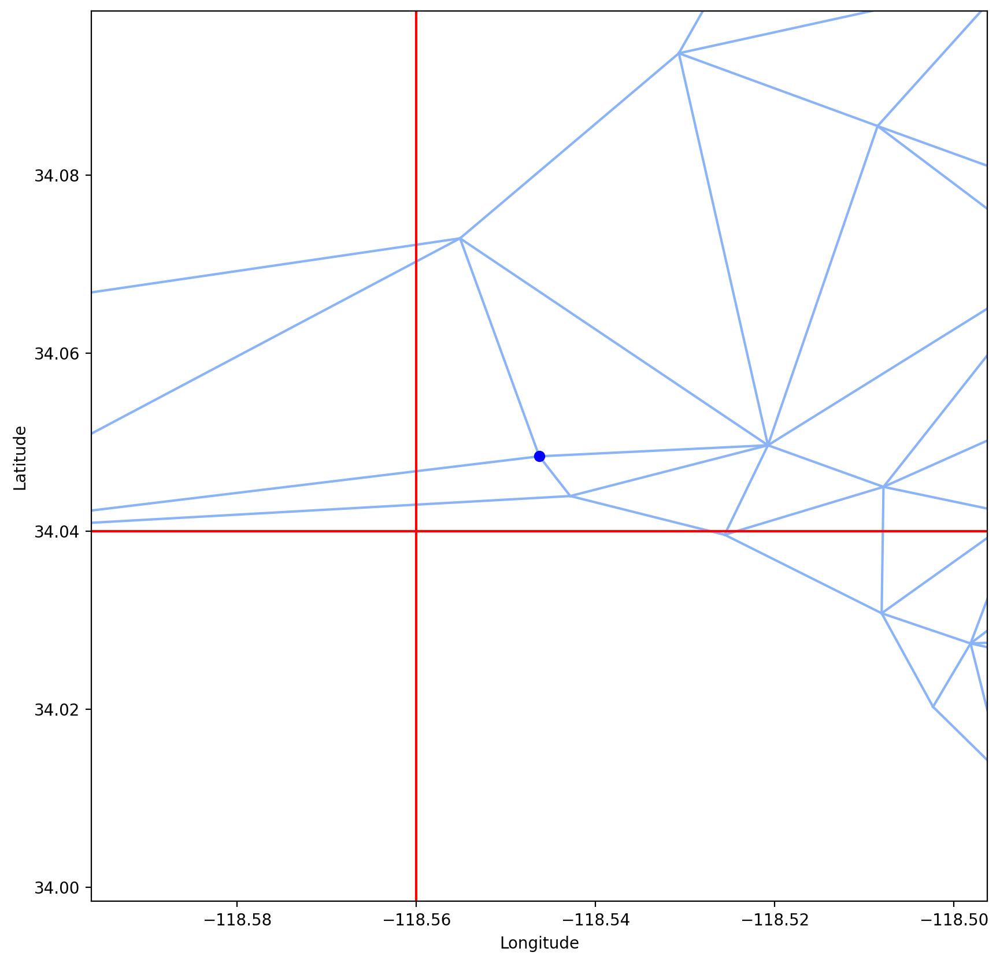

In [21]:
p_ofset = 0.05
plt.figure(figsize=(10,10), dpi=200)
for e in tri_g.es:
    v1 = tri_g.vs[e.source]['coordinates']
    v2 = tri_g.vs[e.target]['coordinates']
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    plt.plot(x, y,'#8ab4f7')
v1_coord = tri_g.vs[malibu_node_idx]['coordinates']
x,y = v1_coord[0],v1_coord[1]
plt.plot(x, y, 'bo')
plt.xlim(x-p_ofset,x+p_ofset)
plt.ylim(y-p_ofset,y+p_ofset)
plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.axvline(x = -118.56, color = 'r', linestyle = '-')
plt.axhline(y = 34.04, color = 'r', linestyle = '-')
plt.show()


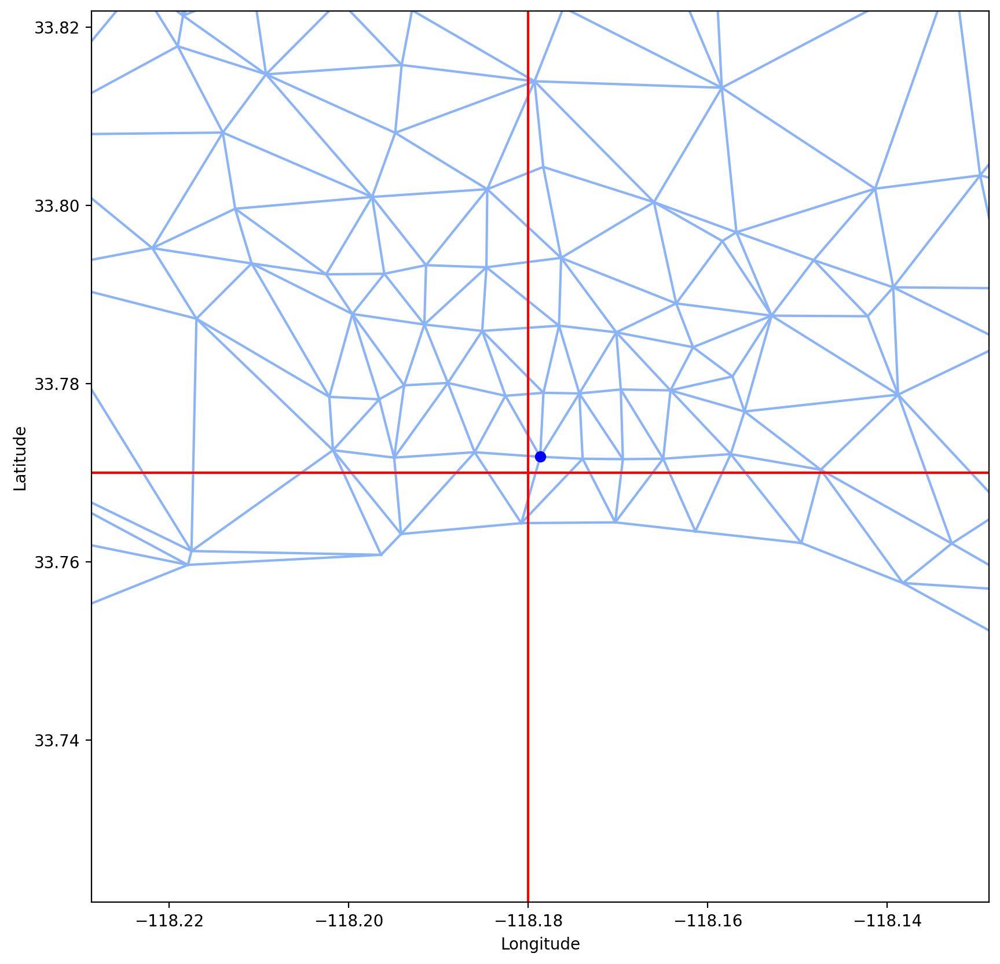

In [22]:
plt.figure(figsize=(10,10), dpi=200)
for e in tri_g.es:
    v1 = tri_g.vs[e.source]['coordinates']
    v2 = tri_g.vs[e.target]['coordinates']
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    plt.plot(x, y,'#8ab4f7')
v1_coord = tri_g.vs[long_beach_node_idx]['coordinates']
x,y = v1_coord[0],v1_coord[1]
plt.plot(x, y, 'bo')
plt.xlim(x-p_ofset,x+p_ofset)
plt.ylim(y-p_ofset,y+p_ofset)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.axvline(x = -118.18, color = 'r', linestyle = '-')
plt.axhline(y = 33.77, color = 'r', linestyle = '-')
plt.show()

In [23]:
#Question 17
trim_thresh = 800
edges_to_induce = tri_g.es.select(weight_le=trim_thresh)
tri_g_trimmed = tri_g.subgraph_edges(edges_to_induce)

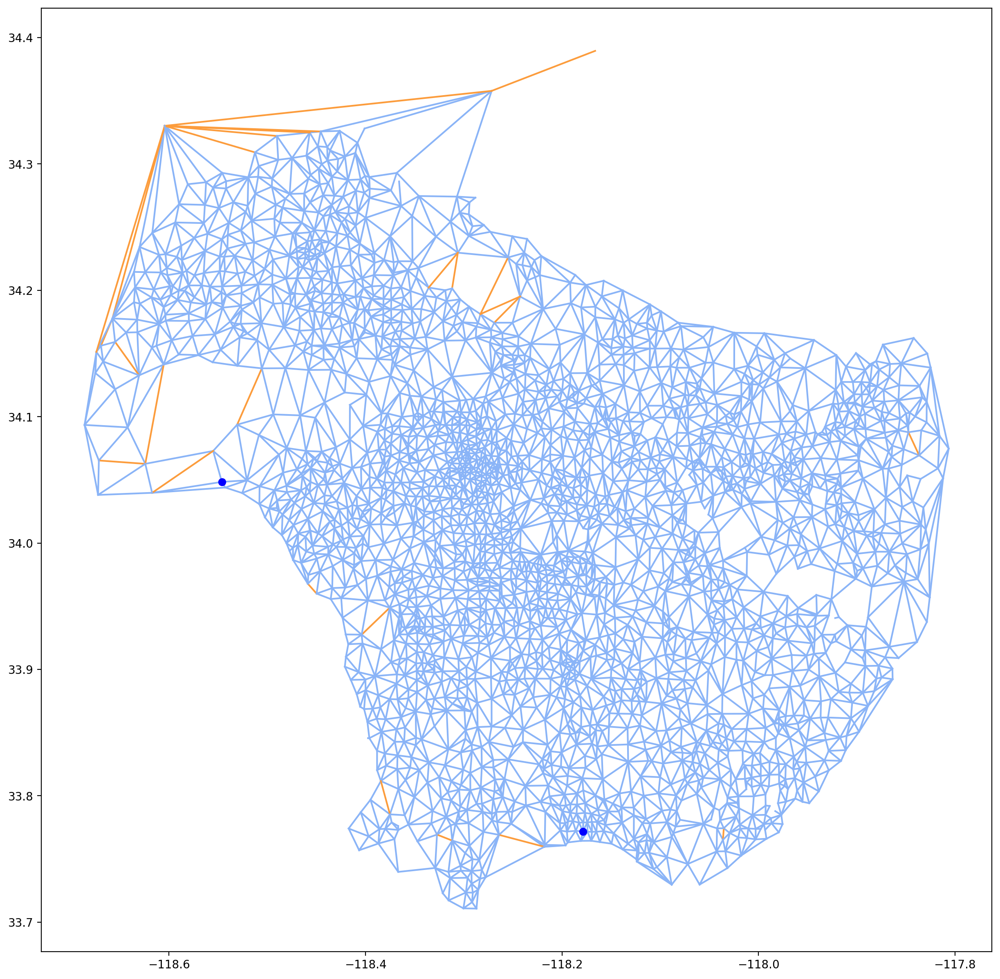

In [24]:
plt.figure(figsize=(15,15), dpi=200)
for e in tri_g.es:
    v1 = tri_g.vs[e.source]['coordinates']
    v2 = tri_g.vs[e.target]['coordinates']
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    plt.plot(x, y, '#8ab4f7' if e['weight'] < trim_thresh else '#fc9c3c')
v1 = tri_g.vs[malibu_node_idx]['coordinates']
v2 = tri_g.vs[long_beach_node_idx]['coordinates']
data = np.vstack([v1, v2])
x = data[:, 0]
y = data[:, 1]
plt.plot(x, y, 'bo')
plt.show()

In [25]:
visual_style = {}
visual_style["bbox"] = (300, 300)
visual_style["margin"] = 10
visual_style["vertex_size"] = 2
igraph.plot(tri_g_trimmed,**visual_style)

In [26]:
#

malibu_coordinates = [-118.56, 34.04]
long_beach_coordinates = [-118.18,33.77]
malibu_node_idx= np.argmin(np.sum((tri_g_trimmed.vs["coordinates"]- np.array(malibu_coordinates))**2,axis = 1))
long_beach_node_idx= np.argmin(np.sum((tri_g_trimmed.vs["coordinates"]- np.array(long_beach_coordinates))**2,axis = 1))
malibu_node = tri_g_trimmed.vs[malibu_node_idx]
long_beach_node = tri_g_trimmed.vs[long_beach_node_idx]
print(malibu_node)
print(long_beach_node)

igraph.Vertex(<igraph.Graph object at 0x00000197C92B1540>, 1511, {'display_name': 'Census Tract 262604', 'coordinates': array([-118.54625915,   34.04840305])})
igraph.Vertex(<igraph.Graph object at 0x00000197C92B1540>, 660, {'display_name': 'Census Tract 576501', 'coordinates': array([-118.1786595,   33.7717677])})


In [27]:
car_length = 0.003

n_lanes = 2

for e in tri_g_trimmed.es:
    v1 = tri_g_trimmed.vs[e.source]['coordinates']
    v2 = tri_g_trimmed.vs[e.target]['coordinates']
    distance = 69*np.linalg.norm(np.array(v1)-np.array(v2))
    e["distance_mile"] = distance
    time = e["weight"]/3600 # hours
    mile_per_hour = distance/time # miles/hours
    safety_distance = mile_per_hour * (2/3600) #miles
    total_cars_on_road = n_lanes * distance/(car_length + safety_distance) # unitless
    cars_per_hour = total_cars_on_road/time # 1/hours
    e["capacity"] = cars_per_hour

max_car_flow = tri_g_trimmed.maxflow(malibu_node, long_beach_node, capacity=tri_g.es["capacity"])    

print('Maximum number of cars than can commute per hour from Malibu to Long Beach: ',max_car_flow)

Maximum number of cars than can commute per hour from Malibu to Long Beach:  Graph flow (4 edges, 1 vs 2646 vertices, value=10898.2788)


In [28]:
n_edge_d_paths = tri_g_trimmed.edge_connectivity(source=malibu_node, target=long_beach_node, checks=True)
print('Number of edge-disjoint paths: ',n_edge_d_paths)

Number of edge-disjoint paths:  4


In [29]:
print('Degrees of nodes (Malibu, Long Beach): ', tri_g_trimmed.degree(malibu_node,mode='all'),tri_g.degree(long_beach_node,mode='all'))

Degrees of nodes (Malibu, Long Beach):  4 6
